## Taxonomic Classification of DNA and RNA Viruses Using Machine Learning

In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, classification_report

#### Read the protein sequence data file and store the data in lists

In [2]:
# Initialize empty lists to store data
accession_no = []
virus_name = []
sequence = []
family = []
subfamily = []
genus = []

# Specify the file path
file_path = "virus_pol_protein_seqs.txt"

# Open the file for reading
with open(file_path, "r") as file:
    lines = file.readlines()
    
# Initialize variables to store information temporarily
current_accession = None
current_virus_name = None
current_sequence = []

# Iterate through each line in the file
for line in lines:
    line = line.strip()  # Remove leading/trailing whitespace

    if line.startswith(">"):
        # This line contains accession number and virus name
        parts = line.split(" ")
        current_accession = parts[0].replace(">", "")  # Extract accession number
        parts_2 = line.split("[")
        current_virus_name = parts_2[1].replace("]", "")  # Extract virus name
    elif line.startswith("Family:"):
        family.append(line.split(":")[1].strip())  # Extract family
    elif line.startswith("Subfamily:"):
        subfamily.append(line.split(":")[1].strip())  # Extract subfamily
    elif line.startswith("Genus:"):
        genus.append(line.split(":")[1].strip())  # Extract genus
    else:
        # This line contains a sequence part
        current_sequence.append(line)

    if not line:
        # Empty line indicates the end of a protein sequence
        if current_accession and current_virus_name and current_sequence:
            # Append the collected information to the respective lists
            accession_no.append(current_accession)
            virus_name.append(current_virus_name)
            sequence.append("".join(current_sequence))

        # Reset temporary variables for the next sequence
        current_accession = None
        current_virus_name = None
        current_sequence = []

# Check the collected data
print("Accession Numbers:", accession_no[:5])  # Display the first 5 accession numbers as a sample
print("Virus Names:", virus_name[:5])  # Display the first 5 virus names as a sample
print("Sequences:", sequence[:2])  # Display the first 2 sequences as a sample
print("Families:", family[:5])  # Display the first 5 family names as a sample
print("Subfamilies:", subfamily[:5])  # Display the first 5 subfamily names as a sample
print("Genera:", genus[:5])  # Display the first 5 genus names as a sample

Accession Numbers: ['QLE11824.1', 'AGT21332.1', 'QHA24723.1', 'QGX41950.1', 'AFU92103.1']
Virus Names: ['bat alphacoronavirus isolate AMA_L_F', 'Bat coronavirus CDPHE15/USA/2006', 'Hipposideros pomona bat coronavirus CHB25', 'alphacoronavirus sp. WA3607', 'Rousettus bat coronavirus HKU10']
Sequences: ['QAYLNRVRGSSAARLEPLNGSDVDVVVRAFDIYNARVACIAKYPKTNCVRMHNLDERDAFWVIKKCTKSCMDLEQDMYNKLKCSKAVAQHEFFEWRDGRSIYGNVVRRNLTKYTMMDLCYALRNFDEKDCDILRDILVLTGACEESYFDNPKWYDPVENEDIHMVYAKLGRIVATAMLKCVAMCDTMIEQGVVGVLTLDNQDLNGDFYDFGDFIQTLPGMGVPLVTSYYSYMMPVMGMTNCLAHECFQKSDIFGSDFKTFDLLTYDFTEHKEKLFNKYFKYWGQDYHPNCVDCYDEMCIVHCANFNTLFATTIPPTAFGPLCRKVFVDGVPLVATAGYHFKQLGIVWNQDVNVHSTRLSINELLQFVADPALLIASSPALVDKRTVCFSVAALSTGMTKQTVKPGHFNQEFYEFLKGKGFFNEGSSLTLKHFFFAQKDDAAIKDFDFYRYNRTTMLDICQARVAYKVVTHYFDCYEGGCISAKDVVVTNLNKSAGYPLNKLGKAGLYYESLSYDEQDHLYALTKRNILPTMTQLNLKYAISGKERARTVGGVSLLSTMTTRQFHQKHLKSIVNTRNATVVIGTTKFYGGWDNMLNTLISGVENPCLMGWDYPKCDRALPSMIRMISAMILGSKHVTCCTASDKYYRLCNELAQVLTEVVYSNGGFYFKPGGTTSGDATTAYANSVFNIFQAVSANI

#### Create a table dataframe from lists using Pandas

In [3]:
# Create a dictionary from the lists
data = {
    "family": family,
    "subfamily": subfamily,
    "genus": genus,
    "virus_name": virus_name,
    "accession_no": accession_no,
    "sequence": sequence
}

# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Reorder the columns
df = df[["family", "subfamily", "genus", "virus_name", "accession_no", "sequence"]]

# Display the DataFrame
print(df.shape)
df.head()

(1036, 6)


,family,subfamily,genus,virus_name,accession_no,sequence
0,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,bat alphacoronavirus isolate AMA_L_F,QLE11824.1,QAYLNRVRGSSAARLEPLNGSDVDVVVRAFDIYNARVACIAKYPKT...
1,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Bat coronavirus CDPHE15/USA/2006,AGT21332.1,QSFDSSYLNRARGSSAARLEPCNGTDTDHVYRAFDIYNKDVACIGQ...
2,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Hipposideros pomona bat coronavirus CHB25,QHA24723.1,NGYLNRARGSSAAQLEPCNGTDTDHCVRAFDIYNKDVACLGKFLKV...
3,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,alphacoronavirus sp. WA3607,QGX41950.1,QSYLNRARGSSAARLEPCNGTDTDHVVRAFDVYNKDVACIGKFLKV...
4,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Rousettus bat coronavirus HKU10,AFU92103.1,NGYFKRARGSSAAQLEPCNGTDTDHCVRAFDIYNKDVACLGKFLKT...


In [4]:
# Analysis of the protein sequence counts in individual genera
df.genus.value_counts()

Varicellovirus         120
Simplexvirus           116
Betacoronavirus        115
Lentivirus             107
Gammacoronavirus       105
Cytomegalovirus         61
Rhadinovirus            56
Alphacoronavirus        50
Deltacoronavirus        49
Roseolovirus            48
Alphainfluenzavirus     25
Deltainfluenzavirus     25
Gammainfluenzavirus     25
Betainfluenzavirus      25
Mardivirus              25
Percavirus              21
Macavirus               18
Simiispumavirus         16
Betaretrovirus          16
Gammaretrovirus         13
Name: genus, dtype: int64

In [5]:
# Create a new column named "sequence_length" to store the information of protein sequence lengths
df["sequence_length"] = [len(seq) for seq in df.loc[:, "sequence"]]
df.head()

,family,subfamily,genus,virus_name,accession_no,sequence,sequence_length
0,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,bat alphacoronavirus isolate AMA_L_F,QLE11824.1,QAYLNRVRGSSAARLEPLNGSDVDVVVRAFDIYNARVACIAKYPKT...,924
1,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Bat coronavirus CDPHE15/USA/2006,AGT21332.1,QSFDSSYLNRARGSSAARLEPCNGTDTDHVYRAFDIYNKDVACIGQ...,928
2,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Hipposideros pomona bat coronavirus CHB25,QHA24723.1,NGYLNRARGSSAAQLEPCNGTDTDHCVRAFDIYNKDVACLGKFLKV...,924
3,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,alphacoronavirus sp. WA3607,QGX41950.1,QSYLNRARGSSAARLEPCNGTDTDHVVRAFDVYNKDVACIGKFLKV...,924
4,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,Rousettus bat coronavirus HKU10,AFU92103.1,NGYFKRARGSSAAQLEPCNGTDTDHCVRAFDIYNKDVACLGKFLKT...,924


In [6]:
# Examine the minimum and maximum protein sequence lengths
print(df['sequence_length'].min())
print(df['sequence_length'].max())

108
6825


#### Cleaning of the dataset

In [7]:
# Select protein sequences with sizes between 560 and 2000 amino acids
df_filtered = df[(df["sequence_length"] >= 560) & (df["sequence_length"] < 2000)]
print("The number of protein sequences after filtration: {} proteins".format(df_filtered.shape[0]))

# Remove duplicates of protein sequences
df_no_duplicates = df_filtered.drop_duplicates(subset='sequence')
print("The number of protein sequence after removal of duplications: {} proteins".format(df_no_duplicates.shape[0]))

The number of protein sequences after filtration: 847 proteins
The number of protein sequence after removal of duplications: 593 proteins


In [8]:
# Generate a summary table to show the protein sequence count for each viral genus
result = df_no_duplicates.groupby(['family', 'subfamily', 'genus'])['genus'].count().reset_index(name='count')
result

,family,subfamily,genus,count
0,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,27
1,Coronaviridae,Orthocoronavirinae,Betacoronavirus,69
2,Coronaviridae,Orthocoronavirinae,Deltacoronavirus,7
3,Coronaviridae,Orthocoronavirinae,Gammacoronavirus,5
4,Orthoherpesviridae,Alphaherpesvirinae,Mardivirus,10
5,Orthoherpesviridae,Alphaherpesvirinae,Simplexvirus,89
6,Orthoherpesviridae,Alphaherpesvirinae,Varicellovirus,51
7,Orthoherpesviridae,Betaherpesvirinae,Cytomegalovirus,53
8,Orthoherpesviridae,Betaherpesvirinae,Roseolovirus,26
9,Orthoherpesviridae,Gammaherpesvirinae,Macavirus,9


In [9]:
# Display the dimension of the created data frame
df_no_duplicates.shape

(593, 7)

In [10]:
# Count the occurrences of each viral genus name in the 'genus' column
genus_counts = df_no_duplicates['genus'].value_counts()

# Get the names of viral genus with counts greater than or equal to 10
selected_genus = genus_counts[genus_counts >= 10].index.tolist()

# Filter the DataFrame to keep rows with genus names in selected_genus
filtered_df_no_duplicates = df_no_duplicates[df_no_duplicates['genus'].isin(selected_genus)]

In [11]:
# Generate a summary table to show the protein sequence count for each viral genus in the filtered dataframe
result2 = filtered_df_no_duplicates.groupby(['family', 'subfamily', 'genus'])['genus'].count().reset_index(name='count')
result2

,family,subfamily,genus,count
0,Coronaviridae,Orthocoronavirinae,Alphacoronavirus,27
1,Coronaviridae,Orthocoronavirinae,Betacoronavirus,69
2,Orthoherpesviridae,Alphaherpesvirinae,Mardivirus,10
3,Orthoherpesviridae,Alphaherpesvirinae,Simplexvirus,89
4,Orthoherpesviridae,Alphaherpesvirinae,Varicellovirus,51
5,Orthoherpesviridae,Betaherpesvirinae,Cytomegalovirus,53
6,Orthoherpesviridae,Betaherpesvirinae,Roseolovirus,26
7,Orthoherpesviridae,Gammaherpesvirinae,Percavirus,14
8,Orthoherpesviridae,Gammaherpesvirinae,Rhadinovirus,36
9,Orthomyxoviridae,Orthomyxoviridae,Alphainfluenzavirus,25


In [12]:
# Save the summary table to a CSV file
result2.to_csv("summary_virus_seqs.csv", index=False)

# Save the entire cleaned protein sequence dataset to a CSV file
filtered_df_no_duplicates.to_csv("virus_pol_protein_seqs.csv", index=False)

In [13]:
# Display the dimension of the final created data frame for ML modeling
filtered_df_no_duplicates.shape

(561, 7)

#### Preprocessing of the dataset

In [14]:
# Make a copy of the dataframe for further analysis
data = filtered_df_no_duplicates.copy()

# Store genus names in a numpy array
categories = np.asarray(data.genus.unique())
categories

array(['Alphacoronavirus', 'Betacoronavirus', 'Mardivirus',
       'Simplexvirus', 'Varicellovirus', 'Cytomegalovirus',
       'Roseolovirus', 'Percavirus', 'Rhadinovirus', 'Lentivirus',
       'Simiispumavirus', 'Gammainfluenzavirus', 'Deltainfluenzavirus',
       'Alphainfluenzavirus', 'Betainfluenzavirus'], dtype=object)

In [15]:
# Encode genus names into numeric numbers
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(categories)
labels_categories_mapping = {labels[i]:categories[i] for i in range(len(labels))}
labels_categories_mapping

{0: 'Alphacoronavirus',
 2: 'Betacoronavirus',
 8: 'Mardivirus',
 13: 'Simplexvirus',
 14: 'Varicellovirus',
 4: 'Cytomegalovirus',
 11: 'Roseolovirus',
 9: 'Percavirus',
 10: 'Rhadinovirus',
 7: 'Lentivirus',
 12: 'Simiispumavirus',
 6: 'Gammainfluenzavirus',
 5: 'Deltainfluenzavirus',
 1: 'Alphainfluenzavirus',
 3: 'Betainfluenzavirus'}

In [16]:
# Use label_encoder to convert genus names into integer labels
genus_labels = np.asarray(data.loc[:, "genus"])
genus_labels = label_encoder.transform(genus_labels)
print(genus_labels.shape)

# Generate a numpy array to store the sequences
sequences = np.asarray(data.loc[:, "sequence"])
print(sequences.shape)

(561,)
(561,)


#### Splitting the dataset into train and test datasets and vectorization of protein sequences

In [17]:
# Split Data by using 20% for the size of the test dataset
X_train, X_test,y_train,y_test = train_test_split(sequences, genus_labels, test_size = 0.2, random_state =43) 

# Create a Count Vectorizer to gather the unique elements in sequence
vect = CountVectorizer(analyzer = 'char_wb', ngram_range = (4,4))

# Fit and Transform CountVectorizer
vect.fit(X_train)
X_train_tf = vect.transform(X_train)
X_test_tf = vect.transform(X_test)

#### Prepare a fasta file to store 113 protein sequences of the test dataset with the information of viral genera and sequence accession numbers

In [18]:
# Initialize empty lists to store matched accession numbers and viral genera
acc_no_test = []
genus_test = []

# Iterate through the DataFrame
for seq in X_test:
    # Check if the sequence exists in the DataFrame
    if any(data['sequence'] == seq):
        # Find the corresponding genus and accession_no and append them to genus_test and acc_no_test, repectively
        genus = data.loc[df['sequence'] == seq, 'genus'].values[0]
        acc_no = data.loc[df['sequence'] == seq, 'accession_no'].values[0]
        genus_test.append(genus)
        acc_no_test.append(acc_no)
    else:
        genus_test.append(None)
        acc_no_test.append(None)  # If not found, you can add None or any other placeholder

# acc_no_test will now contain the matched accession numbers in the same order as X_test
genus_test = np.array(genus_test)
acc_no_test = np.array(acc_no_test)

print(X_test.shape)
print(y_test.shape)
print(genus_test.shape)
print(acc_no_test.shape)

(113,)
(113,)
(113,)
(113,)


In [19]:
# Open the output file for writing
with open("test_protein_seqs.fasta", "w") as output_file:
    # Iterate through the arrays simultaneously using zip
    for genus, acc_no, seq in zip(genus_test, acc_no_test, X_test):
        # Write the formatted lines to the output file
        output_file.write(f">{genus}_{acc_no}\n{seq}\n")

print("Formatted sequences saved to 'test_protein_seqs.fasta'")

Formatted sequences saved to 'test_protein_seqs.fasta'


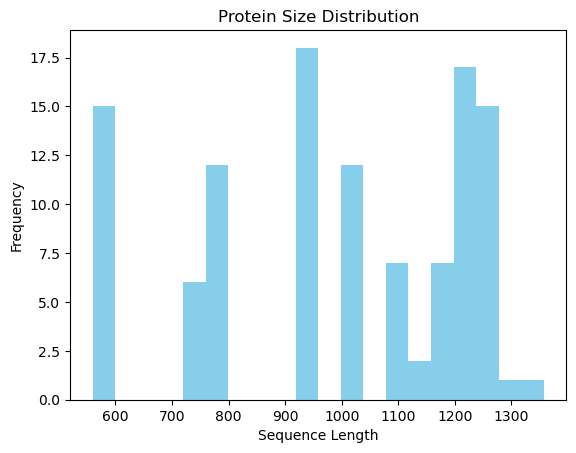

In [20]:
# You can extract the lengths of the sequences
sequence_lengths = [len(seq) for seq in X_test]

# Create a histogram to visualize the distribution
plt.hist(sequence_lengths, bins=20, color='skyblue')
plt.title('Protein Size Distribution')
plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.show()

In [21]:
# Save the results in a single DataFrame
test_data = {'genus': genus_test, 'accession_no': acc_no_test, 'sequence': X_test}
test_df = pd.DataFrame(test_data)

# Save the DataFrame to a CSV file
test_df.to_csv('test_dataset.csv', index=False)

In [22]:
# Analysis of the composition of the test dataset
test_df.genus.value_counts()

Lentivirus             18
Simplexvirus           16
Betacoronavirus        14
Varicellovirus         12
Cytomegalovirus        11
Rhadinovirus            9
Percavirus              5
Alphainfluenzavirus     5
Deltainfluenzavirus     5
Gammainfluenzavirus     4
Alphacoronavirus        4
Betainfluenzavirus      4
Mardivirus              2
Roseolovirus            2
Simiispumavirus         2
Name: genus, dtype: int64

#### Establish and train supervised machine learning models and test their viral classification performance

##### Naive Bayes Model

In [23]:
import time

# Initial a python dictionary to store the ML compution time
cpt_dict = dict()

# Start the timer
start_time = time.time()

# Naive Bayes Model
model = MultinomialNB()
model.fit(X_train_tf, y_train)
NB_pred_tr = model.predict(X_train_tf)
NB_pred_te = model.predict(X_test_tf)

# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time

# Store the total computation time
cpt_dict['Naive Bayes'] = total_time

# Print the total computation time
print("Total computation time for MultinomialNB: {:.2f} seconds".format(total_time))

Total computation time for MultinomialNB: 0.04 seconds


In [24]:
# Display the computation time
cpt_dict

{'Naive Bayes': 0.04100680351257324}

In [25]:
# Greate a function for assessing the performance of trained ML models
def get_metrics(y_test, y_predicted):
    accuracy = accuracy_score(y_test, y_predicted)
    precision = precision_score(y_test, y_predicted, average='weighted')
    recall = recall_score(y_test, y_predicted, average='weighted')
    f1 = f1_score(y_test, y_predicted, average='weighted')
    return accuracy, precision, recall, f1

In [26]:
# Analysis of the performance of the trained ML model on the train data set using classification_report
NB_report_tr = classification_report(y_train, NB_pred_tr)
print(NB_report_tr)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        20
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        81
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         9
          10       1.00      1.00      1.00        27
          11       1.00      1.00      1.00        24
          12       1.00      1.00      1.00        12
          13       1.00      1.00      1.00        73
          14       1.00      1.00      1.00        39

    accuracy                           1.00       448
   macro avg       1.00      1.00      1.00       448
weighted avg       1.00   

In [27]:
# Analysis of the performance of the trained ML model on the test data set using classification_report
NB_report_te = classification_report(y_test, NB_pred_te)
print(NB_report_te)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        14
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00        11
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00        18
           8       1.00      0.50      0.67         2
           9       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         9
          11       1.00      1.00      1.00         2
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00        16
          14       0.92      1.00      0.96        12

    accuracy                           0.99       113
   macro avg       0.99      0.97      0.98       113
weighted avg       0.99   

In [28]:
# Analysis of the performance of the trained ML model on the train data set using classification metrices
print("Confusion matrix for predictions on protein sequences for ML training\n")
print(pd.crosstab(pd.Series(y_train, name='Actual'), pd.Series(NB_pred_tr, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_train, NB_pred_tr)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences for ML training

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0          23   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0  20   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  55   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0  11   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  42   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0  14   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0  10   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  81   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   8   0   0   0   0   0   0
9           0   0   0   0   0   0   0   0   0   9   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0  27   0   0   0   0
11          0   0  

In [29]:
# Analysis of the performance of the trained ML model on the test data set using classification metrices
print("Confusion matrix for predictions on protein sequences for testing the trained ML model\n")
print(pd.crosstab(pd.Series(y_test, name='Actual'), pd.Series(NB_pred_te, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_test, NB_pred_te)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences for testing the trained ML model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   1   0   0   0   0   0   1
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0   9   0   0   0   0
11

In [30]:
# Add the performance metrics to the lists
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

##### Logistic Regression Model

In [31]:
# Start the timer
start_time = time.time()

# Logistic Regression model
lr_model = LogisticRegression(multi_class='ovr', max_iter=1000)
lr_model.fit(X_train_tf, y_train)
lr_predictions_tr = lr_model.predict(X_train_tf)
lr_predictions_te = lr_model.predict(X_test_tf)

# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time


# Store the total computation time
cpt_dict['Logistic Regression'] = total_time

# Print the total computation time
print("Total computation time for Logistic Regression: {:.2f} seconds".format(total_time))

Total computation time for Logistic Regression: 3.90 seconds


In [32]:
# Display the current data of the computation time library
cpt_dict

{'Naive Bayes': 0.04100680351257324, 'Logistic Regression': 3.9032154083251953}

In [33]:
# Analysis of the performance of the trained ML model on the train data set using classification_report
lr_report_tr = classification_report(y_train, lr_predictions_tr)
print(lr_report_tr)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        20
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        81
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         9
          10       1.00      1.00      1.00        27
          11       1.00      1.00      1.00        24
          12       1.00      1.00      1.00        12
          13       1.00      1.00      1.00        73
          14       1.00      1.00      1.00        39

    accuracy                           1.00       448
   macro avg       1.00      1.00      1.00       448
weighted avg       1.00   

In [34]:
# Analysis of the performance of the trained ML model on the test data set using classification_report
lr_report_te = classification_report(y_test, lr_predictions_te)
print(lr_report_te)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        14
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00        11
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00        18
           8       1.00      0.50      0.67         2
           9       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         9
          11       1.00      1.00      1.00         2
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00        16
          14       0.92      1.00      0.96        12

    accuracy                           0.99       113
   macro avg       0.99      0.97      0.98       113
weighted avg       0.99   

In [35]:
# Analysis of the performance of the trained ML model on the train data set using classification metrices
print("Confusion matrix for predictions on protein sequences for ML training\n")
print(pd.crosstab(pd.Series(y_train, name='Actual'), pd.Series(lr_predictions_tr, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_train, lr_predictions_tr)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences for ML training

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0          23   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0  20   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  55   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0  11   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  42   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0  14   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0  10   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  81   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   8   0   0   0   0   0   0
9           0   0   0   0   0   0   0   0   0   9   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0  27   0   0   0   0
11          0   0  

In [36]:
# Analysis of the performance of the trained ML model on the test data set using classification metrices
print("Confusion matrix for predictions on protein sequences for testing the trained ML model\n")
print(pd.crosstab(pd.Series(y_test, name='Actual'), pd.Series(lr_predictions_te, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_test, lr_predictions_te)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

# Add the performance metrics to the lists
accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

Confusion matrix for predictions on protein sequences for testing the trained ML model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   1   0   0   0   0   0   1
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0   9   0   0   0   0
11

##### Random Forest model

In [37]:
# Start the timer
start_time = time.time()

# Random Forest model
rf_model = RandomForestClassifier()
rf_model.fit(X_train_tf, y_train)
rf_predictions_tr = lr_model.predict(X_train_tf)
rf_predictions_te = rf_model.predict(X_test_tf)

# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time


# Store the total computation time
cpt_dict['Random Forest'] = total_time

# Print the total computation time
print("Total computation time for Random Forest: {:.2f} seconds".format(total_time))

Total computation time for Random Forest: 0.80 seconds


In [38]:
# Display the current data of the computation time library
cpt_dict

{'Naive Bayes': 0.04100680351257324,
 'Logistic Regression': 3.9032154083251953,
 'Random Forest': 0.7996418476104736}

In [39]:
# Analysis of the performance of the trained ML model on the train data set using classification_report
rf_report_tr = classification_report(y_train, rf_predictions_tr)
print(rf_report_tr)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        20
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        81
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         9
          10       1.00      1.00      1.00        27
          11       1.00      1.00      1.00        24
          12       1.00      1.00      1.00        12
          13       1.00      1.00      1.00        73
          14       1.00      1.00      1.00        39

    accuracy                           1.00       448
   macro avg       1.00      1.00      1.00       448
weighted avg       1.00   

In [40]:
# Analysis of the performance of the trained ML model on the test data set using classification_report
rf_report_te = classification_report(y_test, rf_predictions_te)
print(rf_report_te)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        14
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00        11
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00        18
           8       1.00      0.50      0.67         2
           9       1.00      1.00      1.00         5
          10       0.90      1.00      0.95         9
          11       1.00      0.50      0.67         2
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00        16
          14       0.92      1.00      0.96        12

    accuracy                           0.98       113
   macro avg       0.99      0.93      0.95       113
weighted avg       0.98   

In [41]:
# Analysis of the performance of the trained ML model on the train data set using classification metrices
print("Confusion matrix for predictions on protein sequences for ML training\n")
print(pd.crosstab(pd.Series(y_train, name='Actual'), pd.Series(rf_predictions_tr, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_train, rf_predictions_tr)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences for ML training

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0          23   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0  20   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  55   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0  11   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  42   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0  14   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0  10   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  81   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   8   0   0   0   0   0   0
9           0   0   0   0   0   0   0   0   0   9   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0  27   0   0   0   0
11          0   0  

In [42]:
# Analysis of the performance of the trained ML model on the test data set using classification metrices
print("Confusion matrix for predictions on protein sequences for testing the trained ML model\n")
print(pd.crosstab(pd.Series(y_test, name='Actual'), pd.Series(rf_predictions_te, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_test, rf_predictions_te)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

# Add the performance metrics to the lists
accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

Confusion matrix for predictions on protein sequences for testing the trained ML model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   1   0   0   0   0   0   1
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0   9   0   0   0   0
11

##### Support Vector Machine (SVM) Model

In [43]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {'kernel': ['linear', 'rbf'], 'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}

# Instantiate GridSearchCV
grid_search = GridSearchCV(SVC(), param_grid, cv=5)

# Fit the data to perform grid search
grid_search.fit(X_train_tf, y_train)

# Retrieve the best parameters
best_params = grid_search.best_params_
print(best_params)

{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}


In [44]:
# Start the timer
start_time = time.time()

# Create an SVM classifier (you can customize the kernel and other hyperparameters)
svm_classifier = SVC(kernel='linear', C=0.1, gamma=0.1, decision_function_shape='ovr')

# Train the SVM model on the training data
svm_classifier.fit(X_train_tf, y_train)

# Make predictions on the train and test data
svm_pred_tr = svm_classifier.predict(X_train_tf)
svm_pred_te = svm_classifier.predict(X_test_tf)

# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time

# Store the total computation time
cpt_dict['Support Vector Machine'] = total_time

# Print the total computation time
print("Total computation time for Support Vector Machine: {:.2f} seconds".format(total_time))

Total computation time for Support Vector Machine: 2.01 seconds


In [45]:
# Display the current data of the computation time library
cpt_dict

{'Naive Bayes': 0.04100680351257324,
 'Logistic Regression': 3.9032154083251953,
 'Random Forest': 0.7996418476104736,
 'Support Vector Machine': 2.0123043060302734}

In [46]:
# Analysis of the performance of the trained ML model on the train data set using classification_report
svm_report_tr = classification_report(y_train, svm_pred_tr)
print(svm_report_tr)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        20
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        81
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         9
          10       1.00      1.00      1.00        27
          11       1.00      1.00      1.00        24
          12       1.00      1.00      1.00        12
          13       1.00      1.00      1.00        73
          14       1.00      1.00      1.00        39

    accuracy                           1.00       448
   macro avg       1.00      1.00      1.00       448
weighted avg       1.00   

In [47]:
# Analysis of the performance of the trained ML model on the test data set using classification_report
svm_report_te = classification_report(y_test, svm_pred_te)
print(svm_report_te)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        14
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00        11
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00        18
           8       1.00      0.50      0.67         2
           9       1.00      1.00      1.00         5
          10       0.90      1.00      0.95         9
          11       1.00      0.50      0.67         2
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00        16
          14       0.92      1.00      0.96        12

    accuracy                           0.98       113
   macro avg       0.99      0.93      0.95       113
weighted avg       0.98   

In [48]:
# Analysis of the performance of the trained ML model on the train data set using classification metrices
print("Confusion matrix for predictions on protein sequences for SVM training\n")
print(pd.crosstab(pd.Series(y_train, name='Actual'), pd.Series(svm_pred_tr, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_train, svm_pred_tr)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences for SVM training

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0          23   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0  20   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  55   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0  11   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  42   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0  14   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0  10   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  81   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   8   0   0   0   0   0   0
9           0   0   0   0   0   0   0   0   0   9   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0  27   0   0   0   0
11          0   0 

In [49]:
# Analysis of the performance of the trained ML model on the test data set using classification metrices
print("Confusion matrix for predictions on protein sequences for testing the trained SVM model\n")
print(pd.crosstab(pd.Series(y_test, name='Actual'), pd.Series(svm_pred_te, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(y_test, svm_pred_te)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

# Add the performance metrics to the lists
accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

Confusion matrix for predictions on protein sequences for testing the trained SVM model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   1   0   0   0   0   0   1
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0   9   0   0   0   0
1

#### Establish and train unsupervised machine learning models and test their classification performance

##### KMeans Model

In [50]:
# Start the timer
start_time = time.time()

# Create the empty lists for storing the ML performance metrics
accuracy_list_tr = []
precision_list_tr = []
recall_list_tr = []
f1_list_tr = []

accuracy_list_te = []
precision_list_te = []
recall_list_te = []
f1_list_te = []

# Loop from n_clusters = 20 to 60 to find the best number of n_clusters to train the KMeans
for n in range(20, 61):
    km1 = KMeans(n_clusters = n, max_iter = 300, tol = 0.0001, random_state=43, verbose=0).fit(X_train_tf)
    km_pred_tr = km1.predict(X_train_tf)
    km_pred_te = km1.predict(X_test_tf)

    # Creat a lookup dictionary to map the KMeans labels to true labels
    KMeans_mapping = {n:None for n in range(n)}
    for i in range(len(y_train)):
        if KMeans_mapping[km_pred_tr[i]] == None:
            KMeans_mapping[km_pred_tr[i]] = [y_train[i]]
        else:
            KMeans_mapping[km_pred_tr[i]].append(y_train[i])
    
    label_lookup = dict()
    for key in KMeans_mapping.keys():
        sub_dict = Counter(KMeans_mapping[key])
        if len(sub_dict) > 1:
            max = 0
            for subkey in sub_dict.keys():           
                if sub_dict[subkey] > max:
                    max = sub_dict[subkey]
                    key_select = subkey
            label_lookup[key] = key_select
        else:
            label_lookup[key] = list(set(KMeans_mapping[key]))[0]
    
    # Use the label_lookup dictionary to convert predicted labels from X_train_tf 
    # for KMeans model performance analysis.
    km_pred_tr_converted = np.asarray([label_lookup[key] for key in km_pred_tr])
    km_pred_te_converted = np.asarray([label_lookup[key] for key in km_pred_te])
    
    # Compute the metrics scores for the train dataset
    accuracy_1, precision_1, recall_1, f1_1 = get_metrics(y_train, km_pred_tr_converted)
    accuracy_list_tr.append(accuracy_1)
    precision_list_tr.append(precision_1)
    recall_list_tr.append(recall_1)
    f1_list_tr.append(f1_1)
    
    # Compute the metrics scores for the test dataset
    accuracy_2, precision_2, recall_2, f1_2 = get_metrics(y_test, km_pred_te_converted)
    accuracy_list_te.append(accuracy_2)
    precision_list_te.append(precision_2)
    recall_list_te.append(recall_2)
    f1_list_te.append(f1_2)


# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time

# Store the total computation time
cpt_dict['KMeans'] = total_time

# Print the total computation time
print("Total computation time for KMeans: {:.2f} seconds".format(total_time))

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` 

Total computation time for KMeans: 242.63 seconds


In [51]:
# Display the current data of the computation time library
cpt_dict

{'Naive Bayes': 0.04100680351257324,
 'Logistic Regression': 3.9032154083251953,
 'Random Forest': 0.7996418476104736,
 'Support Vector Machine': 2.0123043060302734,
 'KMeans': 242.6339545249939}

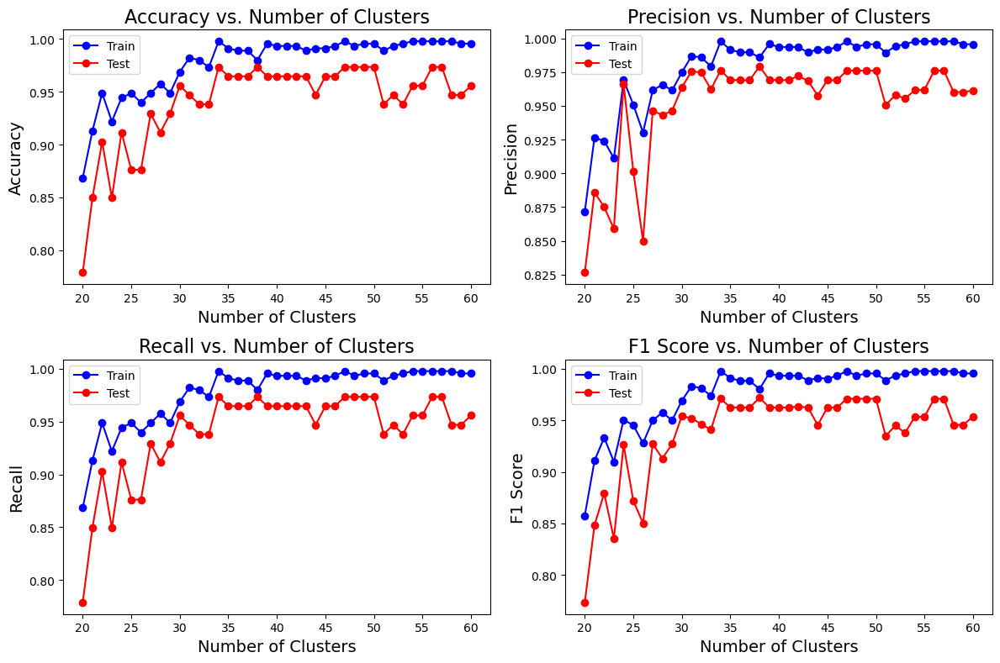

In [52]:
# Visualization of the changes in KMeans performance metrics along with changes in the n-clusters parameter

# Create a range for x-axis (n_clusters)
n_clusters_range = range(20, 61)

# Create subplots with four axes
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Plot Accuracy for train and test datasets
axes[0, 0].plot(n_clusters_range, accuracy_list_tr, marker='o', linestyle='-', color='blue', label='Train')
axes[0, 0].plot(n_clusters_range, accuracy_list_te, marker='o', linestyle='-', color='red', label='Test')
axes[0, 0].set_title('Accuracy vs. Number of Clusters', fontsize=16)  # Increase the font size
axes[0, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[0, 0].set_ylabel('Accuracy', fontsize=14)  # Increase the font size
axes[0, 0].legend()

# Plot Precision for train and test datasets
axes[0, 1].plot(n_clusters_range, precision_list_tr, marker='o', linestyle='-', color='blue', label='Train')
axes[0, 1].plot(n_clusters_range, precision_list_te, marker='o', linestyle='-', color='red', label='Test')
axes[0, 1].set_title('Precision vs. Number of Clusters', fontsize=16)  # Increase the font size
axes[0, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[0, 1].set_ylabel('Precision', fontsize=14)  # Increase the font size
axes[0, 1].legend()

# Plot Recall for train and test datasets
axes[1, 0].plot(n_clusters_range, recall_list_tr, marker='o', linestyle='-', color='blue', label='Train')
axes[1, 0].plot(n_clusters_range, recall_list_te, marker='o', linestyle='-', color='red', label='Test')
axes[1, 0].set_title('Recall vs. Number of Clusters', fontsize=16)  # Increase the font size
axes[1, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[1, 0].set_ylabel('Recall', fontsize=14)  # Increase the font size
axes[1, 0].legend()

# Plot F1 Score for train and test datasets
axes[1, 1].plot(n_clusters_range, f1_list_tr, marker='o', linestyle='-', color='blue', label='Train')
axes[1, 1].plot(n_clusters_range, f1_list_te, marker='o', linestyle='-', color='red', label='Test')
axes[1, 1].set_title('F1 Score vs. Number of Clusters', fontsize=16)  # Increase the font size
axes[1, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[1, 1].set_ylabel('F1 Score', fontsize=14)  # Increase the font size
axes[1, 1].legend()

# Adjust spacing between subplots
plt.tight_layout()

# Save the plots as PNG files
plt.savefig("KMeans_metrics_plots.png", format='png', dpi=600)

# Show the plots
plt.show()

In [53]:
# Create a dictionary to store four lists: accuracy_list, precision_list, recall_list, and f1_list
KMeans_dict = {'n_Clusters':list(range(20, 61)), 'Accuracy': accuracy_list_te, 'Precision': precision_list_te, 
               'Recall': recall_list_te, 'F1 Score': f1_list_te}

# Create a Pandas DataFrame
KMeans_metrics = pd.DataFrame(KMeans_dict)

# Save the KMeans_metrics DataFrame as a CSV file
KMeans_metrics.to_csv("KMeans_metrics.csv", index=False)

# Display the DataFrame
KMeans_metrics

,n_Clusters,Accuracy,Precision,Recall,F1 Score
0,20,0.778761,0.826393,0.778761,0.773334
1,21,0.849558,0.885977,0.849558,0.848212
2,22,0.902655,0.874961,0.902655,0.879285
3,23,0.849558,0.858819,0.849558,0.835225
4,24,0.911504,0.966323,0.911504,0.926203
5,25,0.876106,0.901391,0.876106,0.872046
6,26,0.876106,0.849937,0.876106,0.850120
7,27,0.929204,0.946376,0.929204,0.927079
8,28,0.911504,0.943110,0.911504,0.913000
9,29,0.929204,0.946376,0.929204,0.927079


In [54]:
# compute the performance metrics when n_clusters = 34
km1 = KMeans(n_clusters = 34, max_iter = 300, tol = 0.0001, random_state=43, verbose=0).fit(X_train_tf)
km_pred_tr = km1.predict(X_train_tf)
km_pred_te = km1.predict(X_test_tf)

# Creat a lookup dictionary to map the KMeans labels to true labels
KMeans_mapping = {n:None for n in range(34)}
for i in range(len(y_train)):
    if KMeans_mapping[km_pred_tr[i]] == None:
        KMeans_mapping[km_pred_tr[i]] = [y_train[i]]
    else:
        KMeans_mapping[km_pred_tr[i]].append(y_train[i])

label_lookup = dict()
for key in KMeans_mapping.keys():
    sub_dict = Counter(KMeans_mapping[key])
    if len(sub_dict) > 1:
        max = 0
        for subkey in sub_dict.keys():           
            if sub_dict[subkey] > max:
                max = sub_dict[subkey]
                key_select = subkey
        label_lookup[key] = key_select
    else:
        label_lookup[key] = list(set(KMeans_mapping[key]))[0]

# Use the label_lookup dictionary to convert predicted labels from X_test_tf 
# for KMeans model performance analysis.
km_pred_te_converted = np.asarray([label_lookup[key] for key in km_pred_te])


# Compute the metrics scores for the test dataset
accuracy, precision, recall, f1 = get_metrics(y_test, km_pred_te_converted)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))
accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


accuracy = 0.973 
precision = 0.976 
recall = 0.973 
f1 = 0.971


##### AgglomerativeClustering Model

In [55]:
# Create a Count Vectorizer to gather the unique elements in sequence
vect = CountVectorizer(analyzer = 'char_wb', ngram_range = (4,4))

# Randomize the Data
X, X_2, y, y_2 = train_test_split(sequences, genus_labels, test_size = None, random_state = 42)


# Fit and Transform CountVectorizer
vect.fit(X)
X = vect.transform(X)

In [56]:
# Start the timer
start_time = time.time()

# Create empty lists to store ML performance metrics
accuracy_list2 = []
precision_list2 = []
recall_list2 = []
f1_list2 = []

# Loop from n_clusters = 20 to 60 to find the best number of n_clusters to train the KMeans
for n in range(20, 61):
    agg_clustering = AgglomerativeClustering(n_clusters=n, linkage='ward', compute_full_tree=True).fit(X.toarray())
    agg_pred = agg_clustering.fit_predict(X.toarray())

    # Creat a lookup dictionary to map the AgglomerativeClustering labels to true labels
    agg_mapping = {n:None for n in range(n)}
    for i in range(len(y)):
        if agg_mapping[agg_pred[i]] == None:
            agg_mapping[agg_pred[i]] = [genus_labels[i]]
        else:
            agg_mapping[agg_pred[i]].append(y[i])
    
    agg_label_lookup = dict()
    for key in agg_mapping.keys():
        sub_dict = Counter(agg_mapping[key])
        if len(sub_dict) > 1:
            max = 0
            for subkey in sub_dict.keys():           
                if sub_dict[subkey] > max:
                    max = sub_dict[subkey]
                    key_select = subkey
            agg_label_lookup[key] = key_select
        else:
            agg_label_lookup[key] = list(set(agg_mapping[key]))[0]
    
    # Use the label_lookup dictionary to convert predicted labels from X for 
    # AgglomerativeClustering model performance analysis.
    agg_pred_converted = np.asarray([agg_label_lookup[key] for key in agg_pred])
    
    # Compute the metrics scores
    accuracy, precision, recall, f1 = get_metrics(y, agg_pred_converted)
    accuracy_list2.append(accuracy)
    precision_list2.append(precision)
    recall_list2.append(recall)
    f1_list2.append(f1)

# Stop the timer
end_time = time.time()

# Calculate the total computation time
total_time = end_time - start_time

# Store the total computation time
cpt_dict['AgglomerativeClustering'] = total_time

# Print the total computation time
print("Total computation time for AgglomerativeClustering: {:.2f} seconds".format(total_time))

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedM

Total computation time for AgglomerativeClustering: 220.61 seconds


In [57]:
# Display the current data of the computation time library
cpt_dict

{'Naive Bayes': 0.04100680351257324,
 'Logistic Regression': 3.9032154083251953,
 'Random Forest': 0.7996418476104736,
 'Support Vector Machine': 2.0123043060302734,
 'KMeans': 242.6339545249939,
 'AgglomerativeClustering': 220.6108250617981}

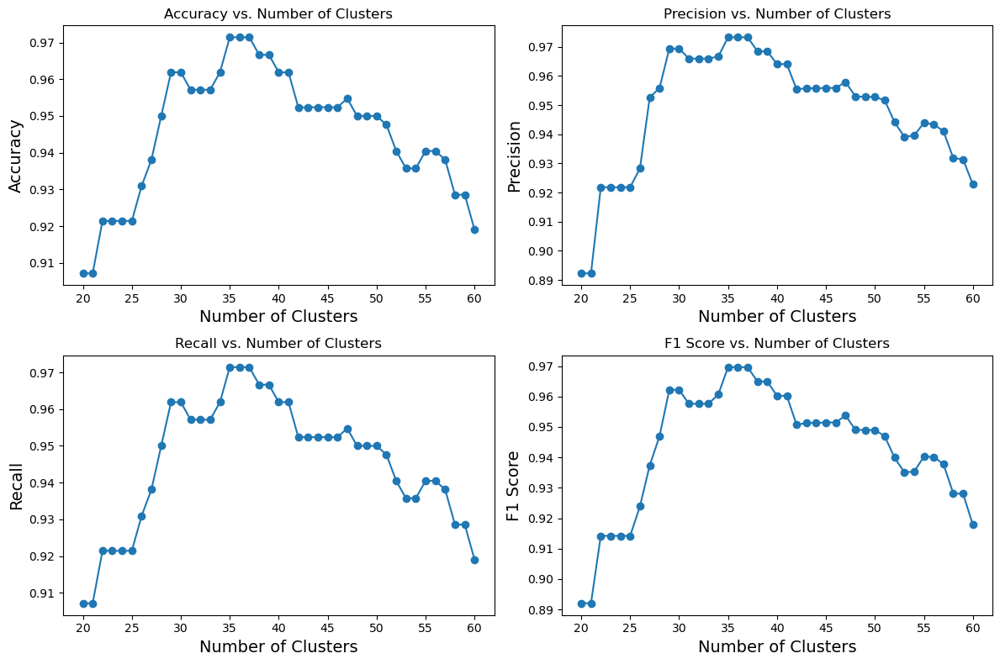

In [58]:
# Visualization of the changes in AgglomerativeClustering performance metrics 
# along with changes in the n-clusters parameter

# Create a range for x-axis (n_clusters)
n_clusters_range = range(20, 61)

# Create subplots with four axes
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Plot Accuracy
axes[0, 0].plot(n_clusters_range, accuracy_list2, marker='o', linestyle='-')
axes[0, 0].set_title('Accuracy vs. Number of Clusters')
axes[0, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[0, 0].set_ylabel('Accuracy', fontsize=14)  # Increase the font size

# Plot Precision
axes[0, 1].plot(n_clusters_range, precision_list2, marker='o', linestyle='-')
axes[0, 1].set_title('Precision vs. Number of Clusters')
axes[0, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[0, 1].set_ylabel('Precision', fontsize=14)  # Increase the font size

# Plot Recall
axes[1, 0].plot(n_clusters_range, recall_list2, marker='o', linestyle='-')
axes[1, 0].set_title('Recall vs. Number of Clusters')
axes[1, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[1, 0].set_ylabel('Recall', fontsize=14)  # Increase the font size

# Plot F1 Score
axes[1, 1].plot(n_clusters_range, f1_list2, marker='o', linestyle='-')
axes[1, 1].set_title('F1 Score vs. Number of Clusters')
axes[1, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
axes[1, 1].set_ylabel('F1 Score', fontsize=14)  # Increase the font size

# Adjust spacing between subplots
plt.tight_layout()

# Save the plots as an image file
plt.savefig("AgglomerativeClustering_metrics.png", format='png', dpi=600, bbox_inches='tight')

# Show the plots
plt.show()

In [59]:
# Create a dictionary using four lists: accuracy_list, precision_list, recall_list, and f1_list
Agglo_dict = {'n_Clusters':list(range(20, 61)), 'Accuracy': accuracy_list2, 'Precision': precision_list2, 
               'Recall': recall_list2, 'F1 Score': f1_list2}

# Create a Pandas DataFrame
Agglo_metrics = pd.DataFrame(Agglo_dict)

# Save the Agglo_metrics DataFrame as a CSV file
Agglo_metrics.to_csv("AgglomerativeClustering_metrics.csv", index = False)

# Display the DataFrame
Agglo_metrics

,n_Clusters,Accuracy,Precision,Recall,F1 Score
0,20,0.907143,0.892297,0.907143,0.892045
1,21,0.907143,0.892297,0.907143,0.892045
2,22,0.921429,0.921846,0.921429,0.914198
3,23,0.921429,0.921846,0.921429,0.914198
4,24,0.921429,0.921846,0.921429,0.914198
5,25,0.921429,0.921846,0.921429,0.914198
6,26,0.930952,0.928341,0.930952,0.923908
7,27,0.938095,0.952681,0.938095,0.937355
8,28,0.950000,0.955891,0.950000,0.946965
9,29,0.961905,0.969435,0.961905,0.962209


In [60]:
# Convert the dictionary into a dataframe
cpt_df = pd.DataFrame(cpt_dict, index = ['Time (sec)'])
cpt_df

,Naive Bayes,Logistic Regression,Random Forest,Support Vector Machine,KMeans,AgglomerativeClustering
Time (sec),0.041007,3.903215,0.799642,2.012304,242.633955,220.610825


In [61]:
# Save the ML computation time data to a csv file
cpt_df.to_csv('ML_computation_time.csv')

In [62]:
# Compute the performance metrics when n_clusters = 35
agg_clustering = AgglomerativeClustering(n_clusters=35, linkage='ward', compute_full_tree=True).fit(X.toarray())
agg_pred = agg_clustering.fit_predict(X.toarray())

# Creat a lookup dictionary to map the AgglomerativeClustering labels to true labels
agg_mapping = {n:None for n in range(35)}
for i in range(len(y)):
    if agg_mapping[agg_pred[i]] == None:
        agg_mapping[agg_pred[i]] = [genus_labels[i]]
    else:
        agg_mapping[agg_pred[i]].append(y[i])

agg_label_lookup = dict()
for key in agg_mapping.keys():
    sub_dict = Counter(agg_mapping[key])
    if len(sub_dict) > 1:
        max = 0
        for subkey in sub_dict.keys():           
            if sub_dict[subkey] > max:
                max = sub_dict[subkey]
                key_select = subkey
        agg_label_lookup[key] = key_select
    else:
        agg_label_lookup[key] = list(set(agg_mapping[key]))[0]

# Use the label_lookup dictionary to convert predicted labels from X for 
# AgglomerativeClustering model performance analysis.
agg_pred_converted = np.asarray([agg_label_lookup[key] for key in agg_pred])

# Compute the metrics scores
accuracy, precision, recall, f1 = get_metrics(y, agg_pred_converted)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))
accuracy_list.append(accuracy)
precision_list.append(precision)
recall_list.append(recall)
f1_list.append(f1)

accuracy = 0.971 
precision = 0.973 
recall = 0.971 
f1 = 0.970


In [63]:
metrics_dict = {'ML Algorithm':['Navie Bayes', 'Logistic Regression', 'Random Forest', 
                                'Support Vector Machine (SVM)', 'KMeans', 'AgglomerativeClustering'],
               'Accuracy':accuracy_list, 'precision':precision_list, 'recall':recall_list, 'f1 score':f1_list}

# Create a Pandas DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Save the ML performance metrics DataFrame as a CSV file
metrics_df.to_csv("ML_performance_metrics.csv", index = False)

# Display the DataFrame
metrics_df

,ML Algorithm,Accuracy,precision,recall,f1 score
0,Navie Bayes,0.991150,0.991831,0.991150,0.989853
1,Logistic Regression,0.991150,0.991831,0.991150,0.989853
2,Random Forest,0.982301,0.983867,0.982301,0.979761
3,Support Vector Machine (SVM),0.982301,0.983867,0.982301,0.979761
4,KMeans,0.973451,0.976344,0.973451,0.971013
5,AgglomerativeClustering,0.971429,0.973294,0.971429,0.969631


#### Visualization of the relationship between protein sequence clusters and viral genera

##### 2D visualization using t-SNE

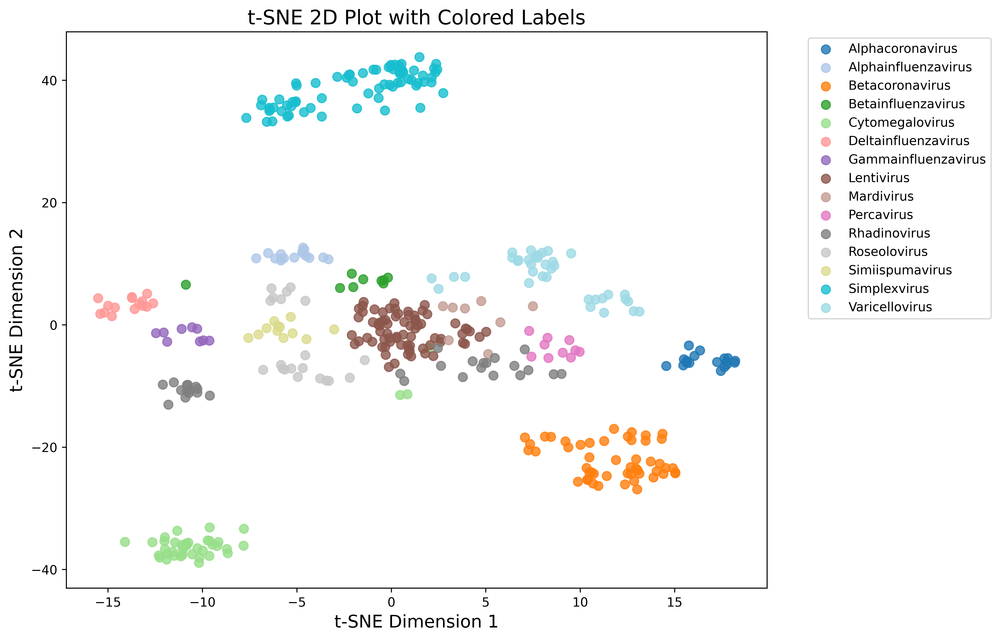

In [64]:
from sklearn.manifold import TSNE

# Convert the labels to genus names
y_cat = np.asarray([labels_categories_mapping[e] for e in y])

# Create a t-SNE model (you can adjust parameters as needed)
tsne_model = TSNE(n_components=2, perplexity=30, random_state=34)

# Fit and transform your transformed data
tsne_results = tsne_model.fit_transform(X.toarray())

# Create a scatter plot
plt.figure(figsize=(10, 8), dpi=600)

# Assign colors based on label_vector (assuming labels are integers)
unique_labels = np.unique(y_cat)
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

for i, label in enumerate(unique_labels):
    mask = (y_cat == label)
    
    # Add jitter to x and y coordinates
    jitter = 1.5  # Adjust this value to control the amount of jitter
    jitter_x = np.random.uniform(-jitter, jitter, size=sum(mask))
    jitter_y = np.random.uniform(-jitter, jitter, size=sum(mask))
    
    plt.scatter(
        tsne_results[mask, 0] + jitter_x,
        tsne_results[mask, 1] + jitter_y,
        label=label,
        c=[colors[i]],
        alpha=0.8,
        s=50,
    )

# Customize the plot with labels and title
plt.title('t-SNE 2D Plot with Colored Labels', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

# Create a separate legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.savefig("t-SNE_plot.png", format='png', dpi=600, bbox_inches='tight')
plt.show()

##### 2D Visualization using UMAP

C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1086: NumbaDeprecationWarning: The 'nopython' keywo

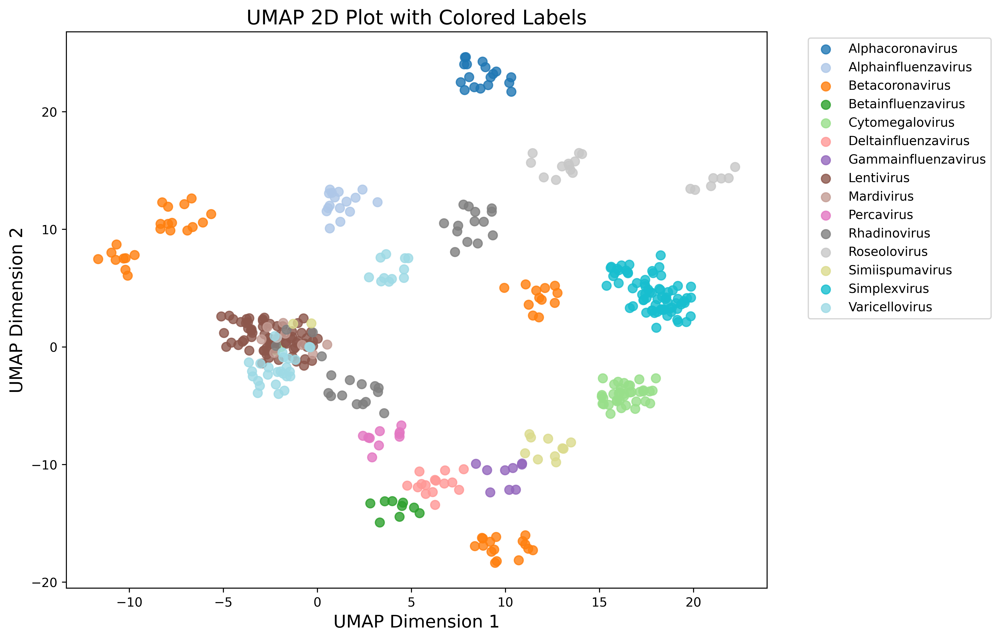

In [65]:
import umap

# Create a UMAP model (you can adjust parameters as needed)
umap_model = umap.UMAP(n_components=2, n_neighbors=10, min_dist=0.1, metric='euclidean', random_state=34)

# Fit and transform your transformed data
umap_results = umap_model.fit_transform(X.toarray())

# Create a scatter plot
plt.figure(figsize=(10, 8), dpi=600)

# Assign colors based on label_vector (assuming labels are integers)
unique_labels = np.unique(y_cat)
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

for i, label in enumerate(unique_labels):
    mask = (y_cat == label)
    
    # Add jitter to x and y coordinates
    jitter = 1.5  # Adjust this value to control the amount of jitter
    jitter_x = np.random.uniform(-jitter, jitter, size=sum(mask))
    jitter_y = np.random.uniform(-jitter, jitter, size=sum(mask))
    
    plt.scatter(
        umap_results[mask, 0] + jitter_x,
        umap_results[mask, 1] + jitter_y,
        label=label,
        c=[colors[i]],
        alpha=0.8,
        s=50,
    )

# Customize the plot with labels and title
plt.title('UMAP 2D Plot with Colored Labels', fontsize=16)
plt.xlabel('UMAP Dimension 1', fontsize=14)
plt.ylabel('UMAP Dimension 2', fontsize=14)

# Create a separate legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.savefig("UMAP_plot.png", format='png', dpi=600, bbox_inches='tight')
plt.show()

#### Phylogenetic Tree Analysis of 113 Viral Protein Sequences from the Test Dataset

In [66]:
import matplotlib
from Bio import Phylo
from io import StringIO

In [67]:
# Create a function to plot the phylogenetic tree
def plot_tree(treedata, output_file):
    tree = Phylo.read(treedata, "newick")
    matplotlib.rc('font', size=7.5)
    # set the size of the figure
    fig = plt.figure(figsize=(11, 20), dpi=600)
    # alternatively
    # fig.set_size_inches(11, 22)
    axes = fig.add_subplot(1, 1, 1)
    Phylo.draw(tree, axes=axes, do_show = False)
    plt.savefig(output_file, format='png', dpi=600, bbox_inches='tight')
    plt.show()

Phylotree files, which are used by the "plot_tree" function to draw the phylogenetic tree, need to be generated from Clustal Omega and Muscle MSA algorithms hosted by ebi.ac.uk.

#### Phylogenetic Tree based on Clustal Omega MSA

In [68]:
# Call the draw tree function by parsing the input and output file names
treedata = "ClustalO_phylotree.txt"
output_file = "Clustalo_tree.png"
plot_tree(treedata, output_file)

#### Phylogenetic Tree based on Muscle MSA

In [69]:
# Call the draw tree function by parsing the input and output file names
treedata = "Muscle_phylotree.txt"
output_file = "Muscle_tree.png"
plot_tree(treedata, output_file)

#### Evaluate the classification performance of Clustal Omega and Muscle MSA algorithms

In [70]:
pred_df = test_df.copy()

# Define the updates
updates = {
    'AAC57976.3': 'Percavirus',
    'WIV69218.1': 'Percavirus',
    'AAO46909.1': 'Percavirus'
}

# Update the dataframe
pred_df['genus'] = pred_df.apply(lambda row: updates.get(row['accession_no'], row['genus']), axis=1)

In [71]:
# Check whether the updates have been successfully incoporated into the dataset
print(pred_df.loc[pred_df.accession_no == 'AAC57976.3', 'genus'])
print(pred_df.loc[pred_df.accession_no == 'WIV69218.1', 'genus'])
print(pred_df.loc[pred_df.accession_no == 'AAO46909.1', 'genus'])

82    Percavirus
Name: genus, dtype: object
88    Percavirus
Name: genus, dtype: object
30    Percavirus
Name: genus, dtype: object


In [72]:
# Convert the genus names into numeric labels
true_genus_labels = label_encoder.transform(np.array(test_df.genus.values))
pred_genus_labels = label_encoder.transform(np.array(pred_df.genus.values))

In [73]:
print(true_genus_labels.shape)
print(pred_genus_labels.shape)

(113,)
(113,)


In [74]:
# Analysis of the performance of Clustal Omega and Muscle on the test data set using classification metrices
print("Confusion matrix for predictions on protein sequences by Clustal Omega/Muscle\n")
print(pd.crosstab(pd.Series(true_genus_labels, name='Actual'), pd.Series(pred_genus_labels, name='Predicted')))

accuracy, precision, recall, f1 = get_metrics(true_genus_labels, pred_genus_labels)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix for predictions on protein sequences by Clustal Omega/Muscle

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   2   0   0   0   0   0   0
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   3   6   0   0   0   0
11         

In [76]:
# Review the true genus names associated with these three accession numbers
print(test_df.loc[test_df.accession_no == 'AAC57976.3', 'genus'])
print(test_df.loc[test_df.accession_no == 'AAO46909.1', 'genus'])
print(test_df.loc[test_df.accession_no == 'WIV69218.1', 'genus'])

82    Rhadinovirus
Name: genus, dtype: object
30    Rhadinovirus
Name: genus, dtype: object
88    Rhadinovirus
Name: genus, dtype: object


#### The information of the python version and packages used in the session

In [78]:
import sys
import platform

# Display Python version
print("Python version:", sys.version)

# Display information of packages used in the current session
print("Packages used in the current session:")
for module_name, module in sys.modules.items():
    if hasattr(module, "__version__"):
        print(f"{module_name}: {module.__version__}")

# Display additional system information
print("\nSystem information:")
print("Platform:", platform.platform())
print("Processor architecture:", platform.architecture())
print("Machine type:", platform.machine())

Python version: 3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:38:37) [MSC v.1916 64 bit (AMD64)]
Packages used in the current session:
re: 2.2.1
ipykernel._version: 6.19.2
json: 2.0.9
jupyter_client._version: 7.4.9
traitlets._version: 5.7.1
traitlets: 5.7.1
logging: 0.5.1.2
zlib: 1.0
platform: 1.0.8
zmq.sugar.version: 23.2.0
zmq.sugar: 23.2.0
zmq: 23.2.0
ipaddress: 1.0
_ctypes: 1.1.0
ctypes: 1.1.0
colorama: 0.4.6
socketserver: 0.4
argparse: 1.1
dateutil: 2.8.2
six: 1.16.0
_decimal: 1.70
decimal: 1.70
jupyter_core.version: 5.3.0
jupyter_core: 5.3.0
platformdirs.version: 2.5.2
platformdirs: 2.5.2
entrypoints: 0.4
jupyter_client: 7.4.9
ipykernel: 6.19.2
IPython.core.release: 8.12.0
executing.version: 0.8.3
executing: 0.8.3
pure_eval.version: 0.2.2
pure_eval: 0.2.2
stack_data.version: 0.2.0
stack_data: 0.2.0
pygments: 2.15.1
pickleshare: 0.7.5
backcall: 0.2.0
decorator: 5.1.1
wcwidth: 0.2.5
prompt_toolkit: 3.0.36
parso: 0.8.3
jedi: 0.18.1
urllib.request: 3.11
IPython: 8.12.0